In [1]:
from torch.utils.data import Dataset
import os
import numpy as np
import scipy.io as sio
from sklearn import preprocessing as P
from sklearn.manifold import TSNE

In [3]:
ds = 'CUB'
mat_visual = sio.loadmat(f"data/{ds}_data/pre_res101_{ds}_features.mat")
# mat_visual = sio.loadmat(f"data/{ds}_data/res101.mat")
features, labels = (
    P.scale(mat_visual["features"], axis=0),
    # mat_visual["features"].T,
    mat_visual["labels"].astype(int).squeeze()-1,
)

aux_mat_visual = sio.loadmat(f"web_feat/pre_res101_{ds}_features.mat")
aux_features, aux_labels = (
    P.scale(aux_mat_visual["features"], axis=0), # (36313, 2048)
    # aux_mat_visual["features"],
    aux_mat_visual["labels"].astype(int).squeeze(), # (36313, )
)

mat_semantic = sio.loadmat(f"data/{ds}_data/att_splits.mat")
trainval_loc = mat_semantic["trainval_loc"].squeeze() - 1
test_seen_loc = mat_semantic["test_seen_loc"].squeeze() - 1
test_unseen_loc = mat_semantic["test_unseen_loc"].squeeze() - 1

train_feature = features[trainval_loc]  # feature
train_label = labels[trainval_loc].astype(int)  
train_label_id = np.unique(train_label)

test_feature_unseen = features[test_unseen_loc]  # 7913 测试集中的未见类
test_label_unseen = labels[test_unseen_loc].astype(int)
test_id_unseen = np.unique(test_label_unseen)

test_feature_seen = features[test_seen_loc]  # 5882  测试集中的已见类
test_label_seen = labels[test_seen_loc].astype(int)
            
tr_cls_centroid = np.zeros((np.unique(labels).shape[0], train_feature.shape[1]))  # 各个seen类的特征中心
for i in train_label_id:
    tr_cls_centroid[i] = np.mean(train_feature[train_label == i], axis=0)


/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/sklearn/preprocessing/data.py:189: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/sklearn/preprocessing/data.py:172: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/s

In [ ]:
# toy experiment for aux feature with LR model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
test_id_unseen = np.unique(test_label_unseen)

# 构建aux feature的unseen训练集
aux_features_unseen = np.array([]).reshape(0, 2048)
aux_labels_unseen = np.array([])
for id in test_id_unseen:
    bat_features_aux = aux_features[aux_labels==id][:100]  
    bat_labels_aux = [id]*len(bat_features_aux)
    aux_features_unseen = np.vstack((aux_features_unseen, bat_features_aux))
    aux_labels_unseen = np.hstack((aux_labels_unseen, bat_labels_aux))
    
print(aux_features_unseen.shape)
print(aux_labels_unseen.shape)

# Conventional ZSL settings 
clf = LogisticRegression(penalty='l2')
clf.fit(aux_features_unseen, aux_labels_unseen)
y_pred = clf.predict(test_feature_unseen)
print('ZSL:', accuracy_score(y_pred, test_label_unseen))
# 0.93

# GZSL 
clf = LogisticRegression(penalty='l2')
clf.fit(aux_features, aux_labels)
y_pred = clf.predict(test_feature_unseen)
u_score = accuracy_score(y_pred,test_label_unseen)

y_pred = clf.predict(test_feature_seen)
s_score = accuracy_score(y_pred,test_label_seen)
print('U:{.4f}, S:{.4f}, H:{.4f}'.format(u_score, s_score, 2*u_score*s_score/(u_score+s_score)))


(5000, 2048)
(5000,)


/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


ZSL: 0.11257162116616111


/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


In [21]:
# 处理后的aux feature
aux_mat_visual = sio.loadmat("web_feat/proc_res101_AWA2_features.mat")
aux_features, aux_labels = (
    P.scale(aux_mat_visual["features"], axis=0), # (36313, 2048)
    # aux_mat_visual["features"],
    aux_mat_visual["labels"].astype(int).squeeze(), # (36313, )
)


# toy experiment for aux feature with LR model
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
test_id_unseen = np.unique(test_label_unseen)

# 构建aux feature的unseen训练集
aux_features_unseen = np.array([]).reshape(0, 2048)
aux_labels_unseen = np.array([])


# Conventional ZSL settings 
clf = LogisticRegression(penalty='l2')
clf.fit(aux_features_unseen, aux_labels_unseen)
y_pred = clf.predict(test_feature_unseen)
print('ZSL:', accuracy_score(y_pred, test_label_unseen))
# 0.93

# GZSL 
clf = LogisticRegression(penalty='l2')
clf.fit(aux_features, aux_labels)
y_pred = clf.predict(test_feature_unseen)
u_score = accuracy_score(y_pred,test_label_unseen)

y_pred = clf.predict(test_feature_seen)
s_score = accuracy_score(y_pred,test_label_seen)
print('U:{:.4f}, S:{:.4f}, H:{:.4f}'.format(u_score, s_score, 2*u_score*s_score/(u_score+s_score)))


/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


ValueError: Found array with 0 sample(s) (shape=(0, 2048)) while a minimum of 1 is required.

In [112]:
keys = ['test_seen_loc', 'test_unseen_loc', 'train_loc', 'trainval_loc', 'val_loc']
cnt = 0
for key in keys:
    print(key, mat_semantic[key].shape)
    cnt += mat_semantic[key].shape[0]
print(cnt)

test_seen_loc (5882, 1)
test_unseen_loc (7913, 1)
train_loc (20218, 1)
trainval_loc (23527, 1)
val_loc (9191, 1)
66731


In [172]:
# 为train class训练分类器， 随机采样其他类作为负样本。通过训练的分类器对aux进行筛选
# from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
clfs = {i:None for i in train_label_id}

for i in train_label_id[:]:
    clf = KNeighborsClassifier(n_neighbors=10)
    true_idx = np.where(train_label==i)[0]
    false_size = len(true_idx)*2
    false_idx = np.random.choice(a=list(np.where(train_label!=i))[0], size=false_size, replace=False)
    train_x = np.vstack((train_feature[true_idx], train_feature[false_idx]))
    train_y = np.array([1]*len(true_idx)+[0]*len(false_idx))
    print(i, len(train_x))
    clf.fit(train_x, train_y)
    clfs[i] = clf

0 2592
1 2070
2 693
3 456
4 1326
5 1797
7 2445
9 1200
10 471
11 225
12 2106
13 1629
14 1704
15 1662
16 711
17 1695
18 2547
19 2127
20 1764
21 1620
24 1698
25 1920
26 2883
27 1683
28 2631
31 1410
32 1344
34 666
35 1776
36 2094
37 2826
38 2076
39 3207
41 1674
42 2463
43 435
44 2052
45 2427
47 1224
48 3252


In [173]:
# 通过分类器对aux_feature进行距离筛选
aux_features_proc = np.array([]).reshape(0, 2048)
aux_labels_proc = np.array([])

threshols_aux = 0.5
for i in train_label_id[:]:
    bat_feats_aux = aux_features[aux_labels==i]
    clf = clfs[i]
    result = clf.predict(bat_feats_aux)
    partial_aux = bat_feats_aux[np.where(result==1)]
    aux_features_proc = np.vstack((aux_features_proc, partial_aux))
    aux_labels_proc = np.hstack((aux_labels_proc, [i]*len(partial_aux)))
    print('class:', i, 'num:', len(bat_feats_aux), '->', len(partial_aux))
is_aux_proc = np.array([0]*len(features_proc) + [1]*len(aux_features_proc))
label_proc_tsne = np.hstack((labels_proc, aux_labels_proc))
print(len(is_aux_proc))

class: 0 num: 732 -> 494
class: 1 num: 740 -> 667
class: 2 num: 721 -> 641
class: 3 num: 702 -> 173
class: 4 num: 738 -> 467
class: 5 num: 695 -> 693
class: 7 num: 785 -> 764
class: 9 num: 652 -> 628
class: 10 num: 767 -> 238
class: 11 num: 717 -> 157
class: 12 num: 777 -> 501
class: 13 num: 674 -> 519
class: 14 num: 774 -> 558
class: 15 num: 751 -> 644
class: 16 num: 613 -> 528
class: 17 num: 752 -> 738
class: 18 num: 775 -> 598
class: 19 num: 782 -> 562
class: 20 num: 720 -> 312
class: 21 num: 757 -> 256
class: 24 num: 754 -> 688
class: 25 num: 595 -> 423
class: 26 num: 711 -> 557
class: 27 num: 718 -> 631
class: 28 num: 734 -> 461
class: 31 num: 749 -> 381
class: 32 num: 756 -> 694
class: 34 num: 625 -> 271
class: 35 num: 756 -> 438
class: 36 num: 825 -> 154
class: 37 num: 757 -> 482
class: 38 num: 684 -> 644
class: 39 num: 798 -> 719
class: 41 num: 701 -> 274
class: 42 num: 726 -> 529
class: 43 num: 729 -> 93
class: 44 num: 726 -> 678
class: 45 num: 786 -> 746
class: 47 num: 710 ->

In [169]:
aux_features_proc.shape

(2420, 2048)

In [174]:
# 对aux_feature进行距离筛选
features_proc = np.array([]).reshape(0, 2048)
labels_proc = np.array([])
aux_features_proc = np.array([]).reshape(0, 2048)
aux_labels_proc = np.array([])

threshold = 0.9
threshols_aux = 0.5
for i in train_label_id[:]:
    center = tr_cls_centroid[i]
    center_aux = tr_cls_centroid_aux[i]
    
    bat_feats = train_feature[train_label==i]
    
    dis = np.linalg.norm((bat_feats-np.tile(center, (len(bat_feats),1))), axis=1,ord=2) 
    descend1 = np.argsort(dis)[:int(threshold*len(dis))]
    labels_proc = np.hstack((labels_proc, [i]*len(descend1)))
    features_proc = np.vstack((features_proc, bat_feats[descend1]))
    
    bat_feats_aux = aux_features[aux_labels==i]
    # aux feature到source center的距离
    dis = np.linalg.norm((bat_feats_aux-np.tile(center, (len(bat_feats_aux),1))), axis=1,ord=2)  
    # 取小于平均距离
    partial_aux =  bat_feats_aux[np.where(dis < dis.mean())]
    aux_features_proc = np.vstack((aux_features_proc, partial_aux))
    # 只取一定比例的点
    # descend2 = np.argsort(dis)[:int(threshols_aux*len(dis))]  
    # aux_features_proc = np.vstack((aux_features_proc, bat_feats_aux[descend2]))
    
    aux_labels_proc = np.hstack((aux_labels_proc, [i]*len(partial_aux)))
    #print('before:\t source:', len(bat_feats), 'aux:', len(bat_feats_aux))
    #print('after: \t source:', len(bat_feats[descend1]), 'aux:', len(bat_feats_aux[descend2]))
    #print('-'*30)
is_aux_proc = np.array([0]*len(features_proc) + [1]*len(aux_features_proc))
label_proc_tsne = np.hstack((labels_proc, aux_labels_proc))


class 0
class 1
class 2
class 3
class 4
class 5
class 7
class 9
class 10
class 11
class 12
class 13
class 14
class 15
class 16
class 17
class 18
class 19
class 20
class 21
class 24
class 25
class 26
class 27
class 28
class 31
class 32
class 34
class 35
class 36
class 37
class 38
class 39
class 41
class 42
class 43
class 44
class 45
class 47
class 48
36478


(2138, 2048)

In [175]:
# tsne 过滤
tsne = TSNE()
feat_proc_tsne = tsne.fit_transform(np.vstack((features_proc, aux_features_proc)))


In [140]:
features_proc.shape

(2138, 2048)

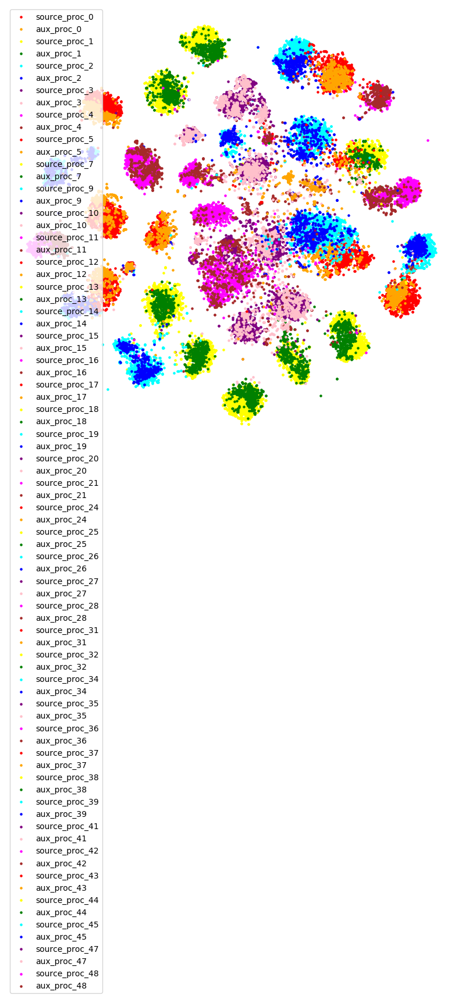

In [176]:
# 自提的特征
%matplotlib inline 
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10),dpi=100)
plt.axis('off')  #去掉坐标轴
cs = ['red','orange','yellow','green','cyan',
      'blue','purple','pink','magenta','brown']
for idx, l in enumerate(train_label_id):
    cidx = (idx%5)*2
    plot_feat_source = np.array([feat_proc_tsne[idx] for idx in range(len(feat_proc_tsne)) if label_proc_tsne[idx]==l and is_aux_proc[idx]==0])
    plot_feat_aux = np.array([feat_proc_tsne[idx] for idx in range(len(feat_proc_tsne)) if label_proc_tsne[idx]==l and is_aux_proc[idx]==1])
    plt.scatter(plot_feat_source[:,0], plot_feat_source[:,1],  c=cs[cidx], s=5, label='source_proc_%i'% l)
   # plt.scatter(feat_tsne[-1,0], feat_tsne[-1,1],  c='green', s=30, label='Center')
    plt.scatter(plot_feat_aux[:,0], plot_feat_aux[:,1],  c=cs[cidx+1], s=5, label='aux_proc_%i'% l)

plt.legend() 


In [40]:
# 对source 与aux进行tsne
source_tsne = np.array([]).reshape(0, 2048)
source_label = []
aux_tsne = np.array([]).reshape(0, 2048)
aux_label = []
for l in range(5):
    feat1 = features[l==labels]
    feat2 = aux_features[l==aux_labels]
    source_tsne = np.vstack((source_tsne, feat1))
    source_label = np.hstack((source_label, [l]*len(feat1)))
    
    aux_tsne = np.vstack((aux_tsne, feat2))
    aux_label = np.hstack((aux_label, [l]*len(feat2)))

is_aux = np.array([0]*len(source_tsne) + [1]*len(aux_tsne))
print(len(is_aux))

2926


In [41]:
# tsne = TSNE(perplexity=30, n_components=2, init='pca', learning_rate=100, random_state=0)
# feat_tsne = tsne.fit_transform(source_tsne)
# label_tsne = np.hstack((source_label, aux_label))

tsne = TSNE(perplexity=30, n_components=2, init='pca', learning_rate=100, random_state=0)
feat_tsne = tsne.fit_transform(np.vstack((source_tsne, aux_tsne)))
label_tsne = np.hstack((source_label, aux_label))

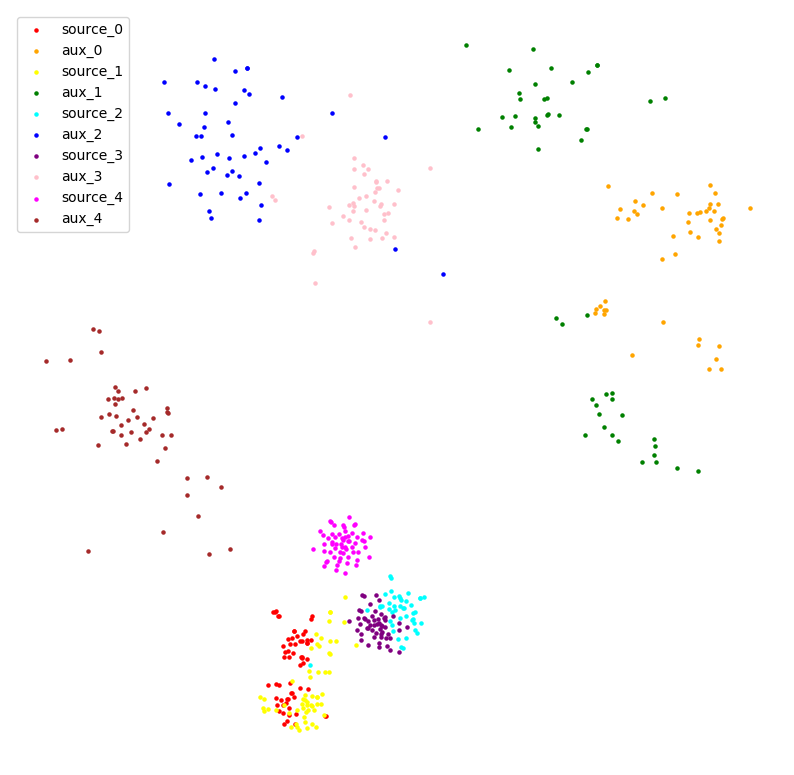

In [42]:
# 自提的特征
%matplotlib inline 
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10),dpi=100)
plt.axis('off')  #去掉坐标轴
cs = ['red','orange','yellow','green','cyan',
      'blue','purple','pink','magenta','brown']
for l in range(5):
    cidx = l*2
    plot_feat_source = np.array([feat_tsne[idx] for idx in range(len(feat_tsne)) if label_tsne[idx]==l and is_aux[idx]==0])
    plot_feat_aux = np.array([feat_tsne[idx] for idx in range(len(feat_tsne)) if label_tsne[idx]==l and is_aux[idx]==1])[:50]
    
    plt.scatter(plot_feat_source[:,0], plot_feat_source[:,1],  c=cs[cidx], s=5, label='source_%i'% l)
   # plt.scatter(feat_tsne[-1,0], feat_tsne[-1,1],  c='green', s=30, label='Center')
    plt.scatter(plot_feat_aux[:,0], plot_feat_aux[:,1],  c=cs[cidx+1], s=5, label='aux_%i'% l)

plt.legend() 


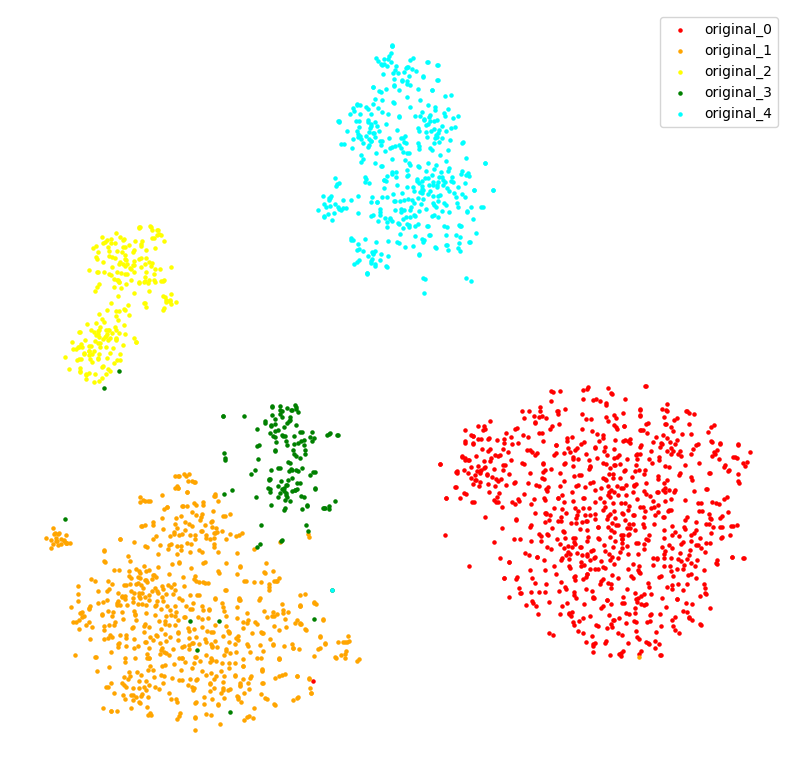

In [123]:
mat_visual = sio.loadmat("data/AWA2_data/res101.mat")
features, labels = (
    mat_visual["features"].T,
    mat_visual["labels"].astype(int).squeeze()-1,
)
mat_semantic = sio.loadmat("data/AWA2_data/att_splits.mat")
trainval_loc = mat_semantic["trainval_loc"].squeeze() - 1

train_feature = features[trainval_loc]  # feature
train_label = labels[trainval_loc].astype(int)  
train_label_id = np.unique(train_label)
# tr_cls_centroid = np.zeros((np.unique(labels).shape[0], train_feature.shape[1]))  # 各个seen类的特征中心
# for i in train_label_id:
#     tr_cls_centroid[i] = np.mean(train_feature[train_label == i], axis=0)

original_feat = np.array([]).reshape(0, 2048)
original_label = []

for l in range(5):
    feat1 = train_feature[l==train_label]
    original_feat = np.vstack((original_feat, feat1))
    original_label = np.hstack((original_label, [l]*len(feat1)))

tsne = TSNE(perplexity=30, n_components=2, init='pca', learning_rate=100, random_state=0)
original_feat_tsne = tsne.fit_transform(original_feat)

%matplotlib inline 
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10),dpi=100)
plt.axis('off')  #去掉坐标轴
cs = ['red','orange','yellow','green','cyan',
      'blue','purple','pink','magenta','brown']
for l in range(5):
    plot_feat_source = original_feat_tsne[original_label==l]

    plt.scatter(plot_feat_source[:,0], plot_feat_source[:,1],  c=cs[int(l)], s=5, label='original_%i'% l)
   # plt.scatter(feat_tsne[-1,0], feat_tsne[-1,1],  c='green', s=30, label='Center')

plt.legend() 



/home/zzc/exp/web_zsl


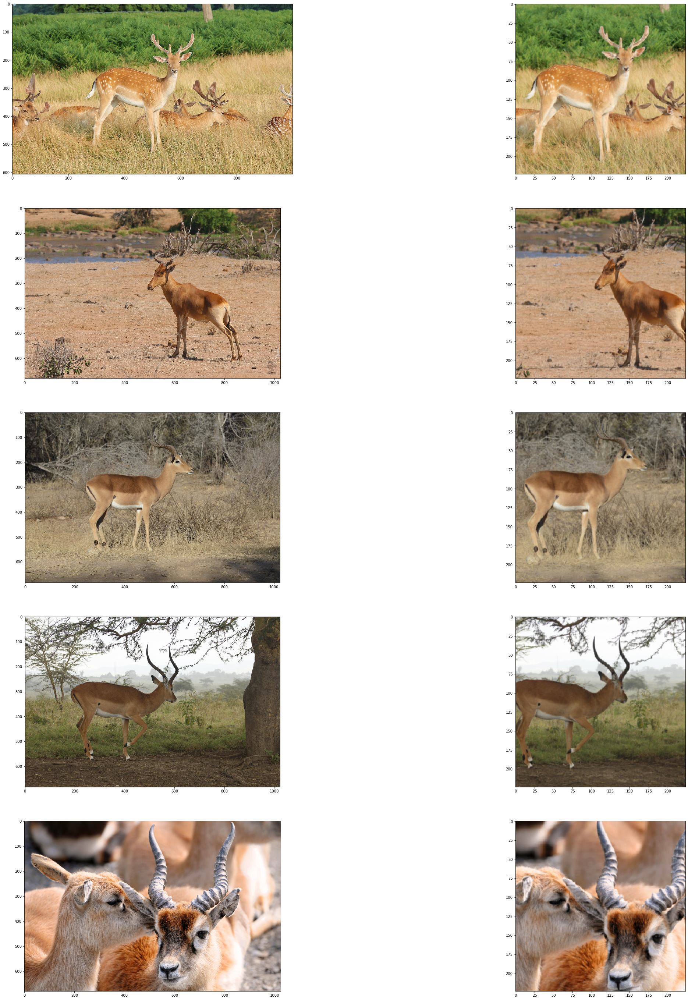

In [65]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.datasets.folder import default_loader
from PIL import Image 

#x=default_loader(img_path)

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                      std=[0.229, 0.224, 0.225])
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()])

plt.figure(figsize=(40, 80))

for i in range(1,11,2):
    img_path = './data/AWA2_data/images/antelope/antelope_1000%s.jpg' % str(i)
    x = Image.open(img_path)
    # 原图
    plt.subplot(8, 2,i)
    plt.imshow(x)

    img = transform(x)
    img=img.numpy().transpose((1,2,0))
    plt.subplot(8, 2, i+1)
    plt.imshow(img)

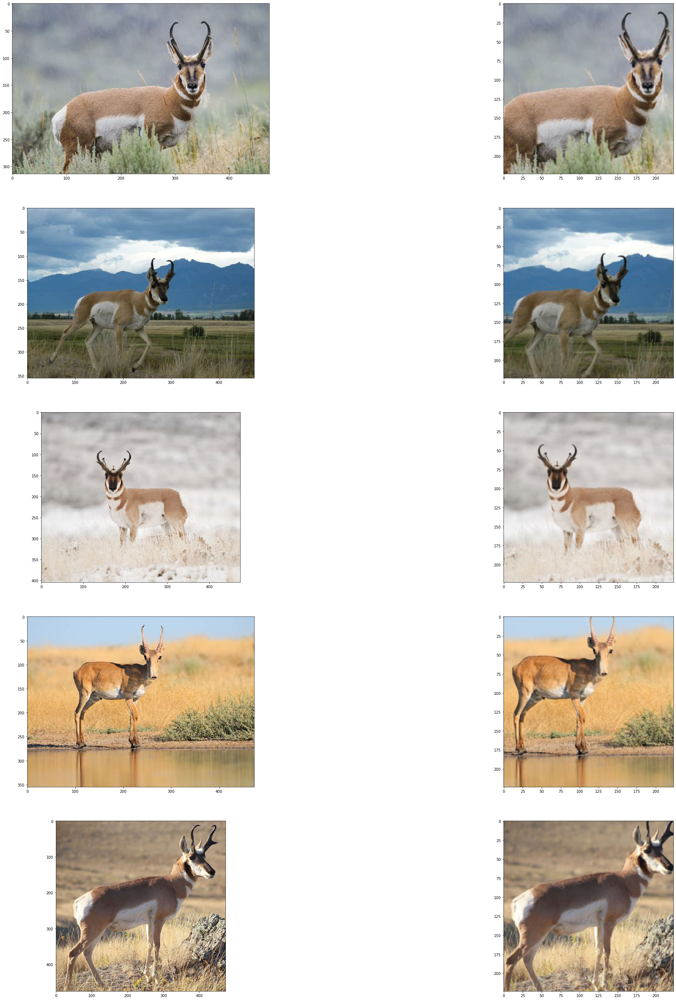

In [62]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.datasets.folder import default_loader
from PIL import Image 

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                      std=[0.229, 0.224, 0.225])
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()])

plt.figure(figsize=(40, 80))

for i in range(1,11,2):
    img_path = './web_data/AWA2/antelope/%s.jpg' % str(i)
    x = Image.open(img_path)
    # 原图
    plt.subplot(8, 2,i)
    plt.imshow(x)

    img = transform(x)
    img=img.numpy().transpose((1,2,0))
    plt.subplot(8, 2, i+1)
    plt.imshow(img)

/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/ipykernel_launcher.py:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/home/zzc/anaconda3/envs/exp/lib/python3.7/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


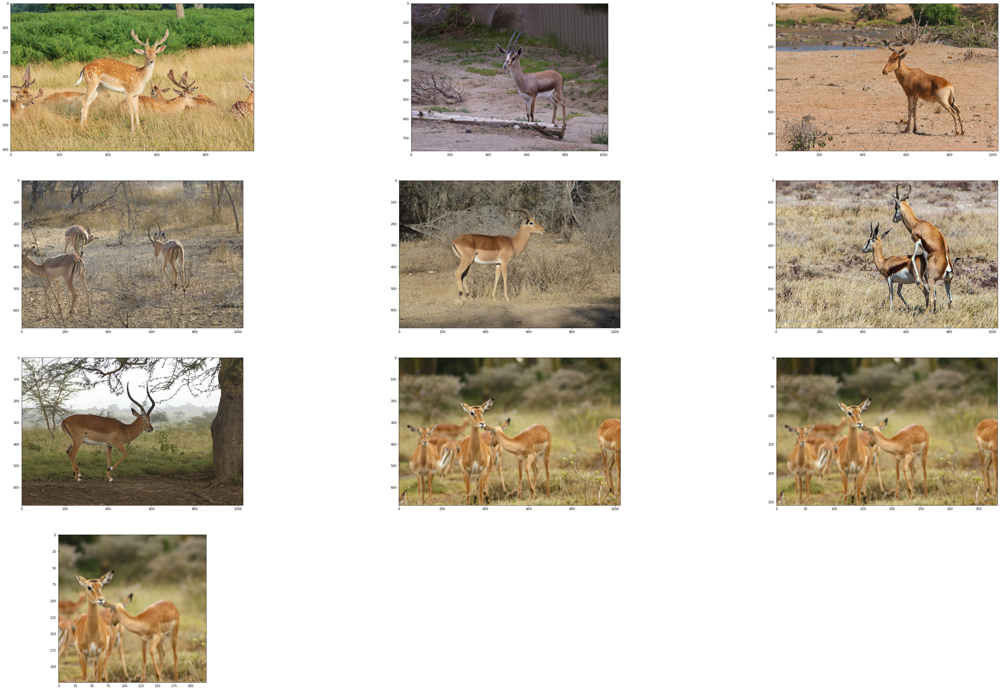

In [107]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from torchvision.datasets.folder import default_loader
from PIL import Image 

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                      std=[0.229, 0.224, 0.225])
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor()])

plt.figure(figsize=(60, 80))
resize = transforms.Resize(256)
crop =  transforms.CenterCrop(224)
for i in range(1,9,1):
    img_path = './data/AWA2_data/images/antelope/antelope_1000%s.jpg' % str(i)
    x = Image.open(img_path)
    # 原图
    plt.subplot(8, 3,i)
    plt.imshow(x)
    
    img = resize(x)
    plt.subplot(8, 3,i+1)
    plt.imshow(img)
    
    img = crop(img)
    plt.subplot(8, 3,i+2)
    plt.imshow(img)
    
#     img=img.numpy().transpose((1,2,0))
#     plt.subplot(8, 3, i+2)
#     plt.imshow(img)

In [22]:




import time # 时间戳
import json # 返回json 处理
import requests # 请求 url
import hashlib # md5 加密

def translate(word):
    url = 'http://fanyi.youdao.com/translate?smartresult=dict&smartresult=rule'
    # http://fanyi.youdao.com/translate?smartresult=dict&smartresult=rule
    # 有道翻译的　API
    t = str(int(time.time()*1000)) # 当前时间戳
    s = "sr_3(QOHT)L2dx#uuGR@r" # 一段用来加密的字符串
    sign_ = "fanyideskweb" + word + t + s

    m = hashlib.md5()  # 根据数据串的内容进行 md5 加密
    m.update((sign_).encode('utf-8'))
    # print(m.hexdigest())
    word_key = {     # key 这个字典为 POST 给有道词典服务器的内容
       'i' :word,
       'from':'AUTO',
       'to':'AUTO',
       'smartresult':'dict',
       'client':'fanyideskweb',
       'salt':t,
       'sign':m.hexdigest(),
       'doctype': 'json',
       'version': '2.1',
       'keyfrom': 'fanyi.web',
       'action': 'FY_BY_CLICKBUTTION',
       'typoResult': 'false'
    }
    response = requests.post(url,data = word_key)# 发送请求
    #print(response)
    # 判断服务器是否相应成功
    if(response.status_code == 200):
        return response.text
    else:
        print("有道 API 调用失败")
        return None

def get_word_result(word):
   # print(word)
    word_result = json.loads(word)
   # 通过　json.loads 把返回的结果加载成 json 格式
    print(word_result)
    print("输入的词为：" + word_result["translateResult"][0][0]['src'])
    print("翻译结果为：" + word_result["translateResult"][0][0]['tgt'])
    return word_result["translateResult"][0][0]['tgt']
input_ = translate('man')
get_word_result(input_)

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [10]:
from bing_crawler import get_search_list
dst = 'SUN'
class_list = get_search_list(dst)
class_list_trans = []
for class_name in class_list:
    cla = class_name.split('_')
    print(cla)
    if len(cla) > 1:
        res = []
        for c in cla:
            r = get_word_result(translate(c))
            res.append(r)
        class_list_trans.append(''.join(res))
    else:
        input_ = translate(cla[0])
        res = get_word_result(input_)
        class_list_trans.append(res)
        
with open(f'data/{dst}_data/trans_class_list.txt','w') as out:
    for n in class_list_trans:
        out.write(n+'\n')

DataSet: SUN Contains 717 classes.
['bakery_shop', 'bar', 'barn', 'boathouse', 'bookstore', 'bridge', 'butchers_shop', 'candy_store', 'carrousel', 'castle', 'cliff', 'closet', 'coast', 'dam', 'dock', 'fastfood_restaurant', 'fly_bridge', 'fountain', 'home_theater', 'house']
['bakery', 'shop']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 0, 'translateResult': [[{'src': 'bakery', 'tgt': '面包店'}]]}
输入的词为：bakery
翻译结果为：面包店
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 0, 'translateResult': [[{'src': 'shop', 'tgt': '商店'}]]}
输入的词为：shop
翻译结果为：商店
['bar']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 0, 'translateResult': [[{'src': 'bar', 'tgt': '酒吧'}]]}
输入的词为：bar
翻译结果为：酒吧
['barn']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'barn', 'tgt': '谷仓'}]]}
输入的词为：barn
翻译结果为：谷仓
['boathouse']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 4, 'translateResult': [[{'src': 'boathouse', 'tgt': '船库'}]]}
输入的词为：boathouse
翻译结果为：船库
['bookstore']
{'type':

{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'underwater', 'tgt': '水下'}]]}
输入的词为：underwater
翻译结果为：水下
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'wreck', 'tgt': '沉船'}]]}
输入的词为：wreck
翻译结果为：沉船
['valley']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'valley', 'tgt': '谷'}]]}
输入的词为：valley
翻译结果为：谷
['viaduct']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'viaduct', 'tgt': '高架桥'}]]}
输入的词为：viaduct
翻译结果为：高架桥
['volcano']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 0, 'translateResult': [[{'src': 'volcano', 'tgt': '火山'}]]}
输入的词为：volcano
翻译结果为：火山
['water', 'tower']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'water', 'tgt': '水'}]]}
输入的词为：water
翻译结果为：水
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 0, 'translateResult': [[{'src': 'tower', 'tgt': '塔'}]]}
输入的词为：tower
翻译结果为：塔
['vegetable', 'garde

{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 0, 'translateResult': [[{'src': 'warehouse', 'tgt': '仓库'}]]}
输入的词为：warehouse
翻译结果为：仓库
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'indoor', 'tgt': '室内'}]]}
输入的词为：indoor
翻译结果为：室内
['art', 'studio']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 0, 'translateResult': [[{'src': 'art', 'tgt': '艺术'}]]}
输入的词为：art
翻译结果为：艺术
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'studio', 'tgt': '工作室'}]]}
输入的词为：studio
翻译结果为：工作室
['thriftshop']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 3, 'translateResult': [[{'src': 'thriftshop', 'tgt': 'thriftshop'}]]}
输入的词为：thriftshop
翻译结果为：thriftshop
['campsite']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'campsite', 'tgt': '营地'}]]}
输入的词为：campsite
翻译结果为：营地
['golf', 'course']
{'type': 'EN2ZH_CN', 'errorCode': 0, 'elapsedTime': 1, 'translateResult': [[{'src': 'golf', 'tgt': '高尔夫球'}]]}
输入的

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [20]:
translate('man')

'<!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 4.0 Transitional//EN">\n<html><head>\n<meta http-equiv="Content-Type" content="text/html; charset=UTF-8">\n<title>有道出错信息</title>\n<link rel="shortcut icon" href="http://shared.youdao.com/images/favicon.ico" type="image/x-icon" />\n<style>\nbody{font-family:arial,sans-serif;font-size:100%}\nTD{FONT-SIZE:100%;LINE-HEIGHT:18px;}\ntable.all{\nwidth:100%;border:0; margin:0; padding:0;\n}\n.pred{color:#CC0033}\n.pgray{color:#9E9E9E}\n\na img{margin:0;padding:0;}\n\na{\n\tcolor:#0000CC;\n\ttext-decoration:underline;\n\tline-height: 120%;\n}\na:link{\n\tcolor:#0000CC;\n\ttext-decoration:underline;\n}\na:visited{\n\tcolor:#660066;\n\ttext-decoration:underline;\n}\n\ntd.logo {padding-left:5px;padding-right:10px;width:160px;}\ntd.setlink {\npadding-bottom:5px;\npadding-top:10px;\nfont-size:75%;\n}\ntd.titlebluestg1 {\nborder-top:1px solid #588ACB;\nbackground:#D0DFF4;\nheight:23px;\npadding-left:10px;\nfont-size:90%;\n}\ntd.mistakett {\npadding-left:175px;